# Modified Neural Network on MNIST Dataset

In [2]:
#Load the dataset
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/mnist-dataset/train-images.idx3-ubyte
/kaggle/input/mnist-dataset/t10k-labels.idx1-ubyte
/kaggle/input/mnist-dataset/t10k-images.idx3-ubyte
/kaggle/input/mnist-dataset/train-labels.idx1-ubyte
/kaggle/input/mnist-dataset/t10k-labels-idx1-ubyte/t10k-labels-idx1-ubyte
/kaggle/input/mnist-dataset/t10k-images-idx3-ubyte/t10k-images-idx3-ubyte
/kaggle/input/mnist-dataset/train-labels-idx1-ubyte/train-labels-idx1-ubyte
/kaggle/input/mnist-dataset/train-images-idx3-ubyte/train-images-idx3-ubyte


In [3]:
#Import the dataset and other python libraries
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import struct
from array import array
from os.path import join

In [4]:
class MnistDataloader(object):
    def __init__(self, training_images_filepath, training_labels_filepath,
                 test_images_filepath, test_labels_filepath):
        self.training_images_filepath = training_images_filepath
        self.training_labels_filepath = training_labels_filepath
        self.test_images_filepath = test_images_filepath
        self.test_labels_filepath = test_labels_filepath

    def read_images_labels(self, images_filepath, labels_filepath):
        labels = []
        with open(labels_filepath, 'rb') as file:
            magic, size = struct.unpack(">II", file.read(8))
            if magic != 2049:
                raise ValueError('Magic number mismatch, expected 2049, got {}'.format(magic))
            labels = array("B", file.read())

        with open(images_filepath, 'rb') as file:
            magic, size, rows, cols = struct.unpack(">IIII", file.read(16))
            if magic != 2051:
                raise ValueError('Magic number mismatch, expected 2051, got {}'.format(magic))
            image_data = array("B", file.read())
        images = []
        for i in range(size):
            images.append([0] * rows * cols)
        for i in range(size):
            img = np.array(image_data[i * rows * cols:(i + 1) * rows * cols])
            img = img.reshape(28, 28)
            images[i][:] = img

        return images, labels

    def load_data(self):
        x_train, y_train = self.read_images_labels(self.training_images_filepath, self.training_labels_filepath)
        x_test, y_test = self.read_images_labels(self.test_images_filepath, self.test_labels_filepath)
        return (x_train, y_train), (x_test, y_test)
    
# Set file paths based on added MNIST Datasets
input_path = '../input'
training_images_filepath = join(input_path, 'mnist-dataset/train-images.idx3-ubyte')
training_labels_filepath = join(input_path, 'mnist-dataset/train-labels.idx1-ubyte')
test_images_filepath = join(input_path, 'mnist-dataset/t10k-images.idx3-ubyte')
test_labels_filepath = join(input_path, 'mnist-dataset/t10k-labels.idx1-ubyte')

# Load MINST dataset
mnist_dataloader = MnistDataloader(training_images_filepath, training_labels_filepath, test_images_filepath, test_labels_filepath)
(x_train, y_train), (x_test, y_test) = mnist_dataloader.load_data()


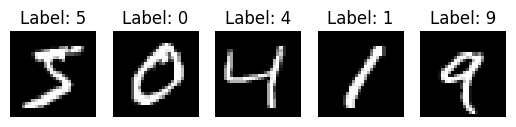

In [5]:
# Display a few images from the training set
num_images_to_display = 5
for i in range(num_images_to_display):
    plt.subplot(1, num_images_to_display, i + 1)
    plt.imshow(x_train[i], cmap='gray')
    plt.title(f"Label: {y_train[i]}")
    plt.axis('off')

plt.show()

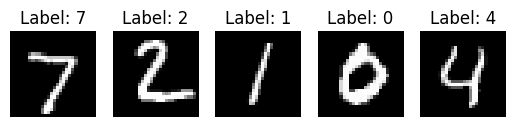

In [6]:
# Display a few images from the testing set
num_images_to_display = 5
for i in range(num_images_to_display):
    plt.subplot(1, num_images_to_display, i + 1)
    plt.imshow(x_test[i], cmap='gray')
    plt.title(f"Label: {y_test[i]}")
    plt.axis('off')

plt.show()

In [7]:
# Base class
class Layer:
    def __init__(self):
        self.input = None
        self.output = None
        self.bias = None
        self.zeta = None
        self.z = None 

    # computes the output Y of a layer for a given input X
    def forward_propagation(self, input):
        raise NotImplementedError

    # computes dE/dX for a given dE/dY (and update parameters if any)
    def backward_propagation(self, output_error, learning_rate):
        raise NotImplementedError

Forward propagation for each layer

        #Z(i) = 0.2 * [{j=1to J} δ ((200 b (j, i) - 100) * (y(j) -  ζ (j, i))) - J + 5] 
        
        #y(i) = ReLU (Zi)

In [22]:
# inherit from base class Layer: Fully connected layer code
class FCLayer(Layer):
    # input_size = number of input neurons
    # output_size = number of output neurons
    def __init__(self, input_size, output_size):
        super().__init__()
        self.input_size = input_size
        self.output_size = output_size
#         print('input_size: ', input_size)
#         print('output_size: ', output_size)
        
        self.prev_zeta_gradient = np.zeros_like(self.zeta)
         # Initialize zeta based on the layer's position
        if input_size == 784:  # First layer
            self.zeta = np.random.rand(1, input_size) - 0.5
            self.bias = np.random.rand(1, input_size) - 0.5
        else:  # Subsequent layers
            self.zeta = np.random.rand(input_size, output_size) - 0.5
            self.bias = np.random.rand(input_size, output_size) - 0.5

#         print('type of self.zeta: ', type(self.zeta))
#         print('shape of self.zeta: ',self.zeta.shape)
#         print('type of self.bias: ',type(self.bias))
#         print('shape of self.bias: ',self.bias.shape)

    # returns output for a given input
    def forward_propagation(self, input_data):
        self.input = input_data
        
        
        self.z = 0.2 * (np.sum(sigmoid((200 * self.bias - 100) * (self.input - self.zeta)) - self.output_size + 5))
        self.output =  self.z   
       
        return self.output

    
    # computes thresholds - zeta, zeta_gradient and bias_gradient
    def backward_propagation(self, is_last_layer, layer_target_output):
        #β(i,k) = 0.2 *  δ' [(200 b(i, k) - 100) (yi - ζ (i , k))] * (200 b(i,k) - 100)
        #θ (i, k) = 0.2 *  δ' [(200 b(i, k) - 100) (yi - ζ (i , k))] * 200 * (yi - ζ (i, k))
        #∇ b(i, k) =  { (yk – tk) * θ (i, k)}, if zk > 0 
        #∇ b(i, k) =  { 0 },  if zk < 0 

        #calculate the beta and theta for the previous layer
        beta = 0.2 * sigmoid_prime((200 * self.bias - 100) * (self.input - self.zeta)) * (200 * self.bias - 100)
        theta = 0.2 * sigmoid_prime((200 * self.bias - 100) * (self.input - self.zeta)) * 200 * (self.input - self.zeta)
#         print('Shape of prev_zeta_gradient before any calculation:', self.prev_zeta_gradient.shape)
#         print('Shape of beta:', beta.shape)
#         print('Shape of theta:', theta.shape)
        
#         print('type of layer_target_output: ', type(layer_target_output))
#         print('shape of layer_target_output: ',layer_target_output.shape)
#         print('type of self.output: ', type(self.output))
#         print('shape of self.output: ',self.output.shape)

        if is_last_layer:
            zeta_gradient = np.where(self.z > 0,(layer_target_output - self.output) * beta, 0)
            bias_gradient = np.where(self.z > 0,(self.output - layer_target_output) * theta, 0)
#             print('shape of zeta_gradient from the is_last_layer statement: ',zeta_gradient.shape)
#             print('shape of bias_gradient from the is_last_layer statement: ',bias_gradient.shape)
        else:
            zeta_gradient = np.where(self.z > 0, np.sum(self.prev_zeta_gradient * beta, axis=1), 0)
            bias_gradient = np.where(self.z > 0, np.sum(self.prev_zeta_gradient * -theta, axis=1), 0)
#             print('shape of zeta_gradient from the else statement: ',zeta_gradient.shape)
#             print('shape of bias_gradient from the else statement: ',bias_gradient.shape)
    
        self.prev_zeta_gradient = zeta_gradient
#         print('Shape of prev_zeta_gradient after calculation:', self.prev_zeta_gradient.shape)
       
        # update parameters
        self.bias = self.bias + bias_gradient
        self.zeta = self.zeta + zeta_gradient

In [9]:
# inherit from base class Layer: Activation Layer code
class ActivationLayer(Layer):
    def __init__(self, activation, activation_prime):
        super().__init__()
        self.activation = activation
        self.activation_prime = activation_prime

    # returns the activated input
    def forward_propagation(self, input_data):
        self.input = input_data
        #y(i) = ReLU (Zi)
        self.output = self.activation(self.input)
        return self.output

    # Not returning anything for the modified NN
    def backward_propagation(self, is_last_layer, layer_target_output):
         _ = self.activation_prime(self.input)

In [20]:
# updated activation function and its derivative
def ReLU(x):
    return np.maximum(0, x)

def ReLU_prime(x):
    return np.where(x > 0, 1, 0)

# Modified Sigmoid activation function and its derivative
def sigmoid(x, alpha=5):
    x = x.astype(float)
    return 1 / (1 + np.exp(-alpha * x))

def sigmoid_prime(x, alpha=5):
    return alpha * sigmoid(x, alpha) * (1 - sigmoid(x, alpha))

In [11]:
# loss function and its derivative
def mse(y_true, y_pred):
    return np.mean(np.power(y_true-y_pred, 2));

def mse_prime(y_true, y_pred):
    return 2*(y_pred-y_true)/y_true.size;

In [28]:
class Network:
    def __init__(self):
        self.layers = []
        self.loss = None
        self.loss_prime = None

    # add layer to network
    def add(self, layer):
        self.layers.append(layer)

    # set loss to use
    def use(self, loss, loss_prime):
        self.loss = loss
        self.loss_prime = loss_prime

    # predict output for given input
    def predict(self, input_data):
        # sample dimension first
        samples = len(input_data)
        result = []

        # run network over all samples
        for i in range(samples):
            # forward propagation
            output = input_data[i]
            for layer in self.layers:
                output = layer.forward_propagation(output)
            result.append(output)

        return result

    # train the network
    def fit(self, x_train, y_train, epochs, learning_rate):
        # sample dimension first
        samples = len(x_train)
#         print('type of y_train: ', type(y_train))
#         print('shape of y_train: ',y_train.shape)

        # training loop
        for i in range(epochs):
            print('Epoch ', i)
            err = 0
            for j in range(samples):
                print('Sample ', j)
#                 print('type of y_train[j]: ', type(y_train[j]))
#                 print('shape of y_train[3]: ',y_train[3].shape)
                # forward propagation
                output = x_train[j]
                for layer in self.layers:
#                     print('forward_propagation for ', layer)
                    output = layer.forward_propagation(output)

                #compute loss (for display purpose only)
                err += self.loss(y_train[j], output)
                
                #compute error for the back propagation
                error = self.loss_prime(y_train[j], output)

                #backward propagation
                for layer in reversed(self.layers):
#                     print('backward_propagation for ', layer)
#                     print(layer)
                    is_last_layer = (layer == self.layers[-2])  # Check if it's the last layerindex
#                     print("is_last_layer:", is_last_layer)
                    layer.backward_propagation(is_last_layer, y_train[j])
                    
            # calculate average error on all samples
            err /= samples
            print('epoch %d/%d   error=%f' % (i+1, epochs, err))

In [ ]:
from keras.utils import to_categorical

# training data : 60000 samples
# Convert x_train and x_test to NumPy array
x_train = np.array(x_train)
y_train = np.array(y_train)
x_test = np.array(x_test)
y_test = np.array(y_test)

# reshape and normalize input data
x_train = x_train.reshape(x_train.shape[0], 1, 28*28)
x_train = x_train.astype('float32')
x_train /= 255

# encode output which is a number in range [0,9] into a vector of size 10
# e.g. number 3 will become [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]
#y_train = to_categorical(y_train)

# same for test data : 10000 samples
x_test = x_test.reshape(x_test.shape[0], 1, 28*28)
x_test = x_test.astype('float32')
x_test /= 255

# encode test output which is a number in range [0,9] into a vector of size 10
#y_test = to_categorical(y_test)

# Network with 4 FC layers
net = Network()

net.add(FCLayer(28*28, 50))                # input_shape=(1, 28*28)    ;   output_shape=(1, 50)
net.add(ActivationLayer(ReLU, ReLU_prime))
net.add(FCLayer(50, 50))                   # input_shape=(1, 50)      ;   output_shape=(1, 50)
net.add(ActivationLayer(ReLU, ReLU_prime))
#net.add(FCLayer(50, 50))                   # input_shape=(1, 50)      ;   output_shape=(1, 50)
#net.add(ActivationLayer(ReLU, ReLU_prime))
net.add(FCLayer(50, 10))                    # input_shape=(1, 50)       ;   output_shape=(1, 10)
net.add(ActivationLayer(sigmoid, sigmoid_prime))

# train
net.use(mse, mse_prime)
net.fit(x_train, y_train, epochs=3, learning_rate=0.1)

# test
#out = net.predict(x_test)

Epoch  0
Sample  0
forward_propagation for  <__main__.FCLayer object at 0x796e848e2050>
forward_propagation for  <__main__.ActivationLayer object at 0x796e8c0bba30>
forward_propagation for  <__main__.FCLayer object at 0x796e848e1210>
forward_propagation for  <__main__.ActivationLayer object at 0x796e848e2d40>
forward_propagation for  <__main__.FCLayer object at 0x796e8c0bbb80>
forward_propagation for  <__main__.ActivationLayer object at 0x796e8c0bbb50>
backward_propagation for  <__main__.ActivationLayer object at 0x796e8c0bbb50>
backward_propagation for  <__main__.FCLayer object at 0x796e8c0bbb80>
backward_propagation for  <__main__.ActivationLayer object at 0x796e848e2d40>
backward_propagation for  <__main__.FCLayer object at 0x796e848e1210>
backward_propagation for  <__main__.ActivationLayer object at 0x796e8c0bba30>
backward_propagation for  <__main__.FCLayer object at 0x796e848e2050>
Sample  1
forward_propagation for  <__main__.FCLayer object at 0x796e848e2050>
forward_propagation 

/tmp/ipykernel_33/3850547413.py:11: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-alpha * x))


forward_propagation for  <__main__.ActivationLayer object at 0x796e848e2d40>
forward_propagation for  <__main__.FCLayer object at 0x796e8c0bbb80>
forward_propagation for  <__main__.ActivationLayer object at 0x796e8c0bbb50>
backward_propagation for  <__main__.ActivationLayer object at 0x796e8c0bbb50>
backward_propagation for  <__main__.FCLayer object at 0x796e8c0bbb80>
backward_propagation for  <__main__.ActivationLayer object at 0x796e848e2d40>
backward_propagation for  <__main__.FCLayer object at 0x796e848e1210>
backward_propagation for  <__main__.ActivationLayer object at 0x796e8c0bba30>
backward_propagation for  <__main__.FCLayer object at 0x796e848e2050>
Sample  46
forward_propagation for  <__main__.FCLayer object at 0x796e848e2050>
forward_propagation for  <__main__.ActivationLayer object at 0x796e8c0bba30>
forward_propagation for  <__main__.FCLayer object at 0x796e848e1210>
forward_propagation for  <__main__.ActivationLayer object at 0x796e848e2d40>
forward_propagation for  <__ma